In [3]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns 

In [4]:
# df = pd.read_csv("../data/train_data_final.csv")
df = pd.read_csv("C:/Users/mlard/OneDrive/Escritorio/Mateo/Org de Datos/tp3Github/Org-Datos-Grupo-19/train_data_final.csv")

In [5]:
pd.set_option('display.max_rows', None)

In [6]:
df.shape

(276572, 192)

In [7]:
df.head()

,Unnamed: 0,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
0,2518955,743d55408505dee752adc6e62b273f4397db6e89f19034...,2017-08-10,0.947242,0.002204,0.008002,1.007516,0.002830,0.453227,0.005992,...,NaN,NaN,0.003183,0.005264,0.007173,NaN,0.009359,0.004306,0.002719,0
1,1781039,522c85a354bfec790067b54e9db7353d20d4709ae5dc93...,2017-07-04,0.757648,0.002076,0.008751,0.814083,0.000408,0.155700,0.004156,...,NaN,NaN,1.000928,0.005655,0.891417,0.14907,1.009381,0.007953,0.095926,0
2,1488700,4488928018c20bf6261e69c8a94a47b6206a2fe91480b8...,2017-07-29,0.392041,0.005770,0.029682,0.810262,0.006672,0.180378,0.005028,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,3174307,9296e983c3e4f99b046952397fc4ba950abf1032a9bd6c...,2017-03-30,0.673978,0.588604,0.295201,0.024650,0.007951,0.125583,0.008760,...,NaN,NaN,0.003558,0.008268,0.000429,NaN,0.005009,0.003020,0.002798,1
4,1379981,3fa10314686e0e51d8f76235eceab91d70aa3f24a98c3e...,2018-01-17,0.778075,0.006930,0.056721,0.819369,0.004922,0.089214,0.006884,...,NaN,NaN,0.004670,0.000125,0.003151,NaN,0.008442,0.000819,0.000342,0


In [8]:
df.info(verbose=True, null_counts=True)

C:\Users\mlard\AppData\Local\Temp\ipykernel_6368\2612161665.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  df.info(verbose=True, null_counts=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 276572 entries, 0 to 276571
Data columns (total 192 columns):
 #    Column       Non-Null Count   Dtype  
---   ------       --------------   -----  
 0    Unnamed: 0   276572 non-null  int64  
 1    customer_ID  276572 non-null  object 
 2    S_2          276572 non-null  object 
 3    P_2          274277 non-null  float64
 4    D_39         276572 non-null  float64
 5    B_1          276572 non-null  float64
 6    B_2          276476 non-null  float64
 7    R_1          276572 non-null  float64
 8    S_3          225400 non-null  float64
 9    D_41         276476 non-null  float64
 10   B_3          276476 non-null  float64
 11   D_42         39357 non-null   float64
 12   D_43         193452 non-null  float64
 13   D_44         262857 non-null  float64
 14   B_4          276572 non-null  float64
 15   D_45         276476 non-null  float64
 16   B_5          276572 non-null  float64
 17   R_2          276572 non-null  float64
 18   D_

In [9]:
cole = [column for column in df.columns if df[column].dtype == 'object']
cole

['customer_ID', 'S_2', 'D_63', 'D_64']

In [10]:
df.sample(10)

,Unnamed: 0,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
217090,5355924,f7d49859d6c1ab66c0c546b917a059ba9866e9e380cfce...,2017-05-30,0.686178,0.000303,0.010137,0.819891,0.005553,NaN,0.005296,...,NaN,NaN,0.009946,0.000046,0.004860,NaN,0.009337,0.001042,0.002079,0
207551,4278718,c5c382cb0a4e6a13172e9303738d1afafeafaac22aa56e...,2018-03-28,-0.010308,0.036155,0.048013,0.105349,0.006792,NaN,0.148361,...,NaN,NaN,0.004901,0.003324,0.004790,NaN,0.002889,0.008683,0.005646,1
14487,462410,157b52746d636f82d38cf259daf50ea80f16e3fca4bd5a...,2017-12-24,0.546047,0.002287,0.043935,1.009169,0.001460,0.412064,0.006737,...,NaN,NaN,1.000534,0.004423,0.916669,0.245841,1.000754,0.448234,0.095546,0
177015,1897433,578863e5678580ce2e879382511dbd3b954b45c016b54f...,2018-03-14,0.168584,0.207267,0.109236,0.037209,0.002456,0.179873,0.002358,...,NaN,NaN,1.004637,0.005775,0.899482,0.178562,1.006550,0.095999,0.094800,1
154383,1228533,38a0b304da16c02a25bf217bea86fcca61e8d991a13a5f...,2017-04-08,0.804972,0.068074,0.043774,1.007550,0.005593,0.101934,0.005244,...,NaN,NaN,0.007281,0.008344,0.001492,NaN,0.001499,0.001214,0.004677,0
138900,3490085,a1386f66f66d46f0cf4333c52ea5ad890cd5dfe8138b42...,2017-12-14,0.437507,0.007882,0.100116,0.146008,0.000714,0.542070,0.003492,...,NaN,NaN,0.004057,0.003953,0.001840,NaN,0.003200,0.007852,0.004575,1
167575,3403190,9d3bf7fbb626eb7eee4e07929fdb1fd90ffc4b745f7570...,2017-09-22,0.654426,0.213896,0.057799,0.330088,0.002847,0.027671,0.642813,...,NaN,NaN,0.001909,0.007544,0.009214,NaN,0.001705,0.000972,0.000833,0
270768,1792876,52b1be3e8887050149fe69a08dd17236fff82af1ea7111...,2018-03-15,0.448741,0.000346,0.220416,0.073009,0.004332,0.166716,0.002581,...,NaN,NaN,1.006268,0.008711,0.950470,0.509791,1.005089,0.026693,0.188512,1
230093,4879969,e19f04d1f36499a2efd5ccb7f86a2f06999b8dc3e62cf2...,2018-01-02,0.084730,0.004603,0.040149,0.264098,0.501281,0.550019,0.004522,...,NaN,NaN,NaN,0.006612,NaN,NaN,NaN,0.002481,NaN,1
157868,1442920,427ed2d781145f02805b3e19793b8d5b78e38109204fcf...,2018-03-10,0.863717,0.008363,0.004711,0.815252,0.006275,NaN,0.009904,...,NaN,NaN,0.008454,0.008357,0.009051,NaN,0.003558,0.006006,0.003692,0


In [11]:
categoricas = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']

In [12]:
df.isnull().sum()

Unnamed: 0          0
customer_ID         0
S_2                 0
P_2              2295
D_39                0
B_1                 0
B_2                96
R_1                 0
S_3             51172
D_41               96
B_3                96
D_42           237215
D_43            83120
D_44            13715
B_4                 0
D_45               96
B_5                 0
R_2                 0
D_46            60599
D_47                0
D_48            35839
D_49           249346
B_6                 4
B_7                 0
B_8              1170
D_50           157194
D_51                0
B_9                 0
R_3                 0
D_52             1492
P_3             15161
B_10                0
D_53           204178
S_5                 0
B_11                0
S_6                 0
D_54               96
R_4                 0
S_7             51172
B_12                0
S_8                 0
D_55             9219
D_56           150015
B_13             2518
R_5                 0
D_58      

In [13]:
df.groupby("customer_ID").size().sort_values(ascending = False)

customer_ID
a19c49b64f5eea11b318c4c61bcc151d93c48bf8baa782211d3d9e66577095f6    7
d29fcecb3105a8d463b8f0292a9617f4b52a9bfe6b90e2b60d9961814880280f    6
5e932111d5a199c9bbefa64ccb1ca44ea43c9440af73c9d8f43ea119e74c1ce7    6
5e08357268f0bf1066130b754f5c850a9ce83d5833b4ef9af6d6ddc5e764a27d    6
a947b96a507d35fe5b66587e12ae7a87a057d27c44d002ffb341a2e501cb9a53    6
5382886bb9ce7018ffb123725def43a70e4ec27d767794c6ef061f96bd243276    6
46136b7c01033ac559add451862260a1765272cb3dbd888950e78d54785e31b5    6
1a640ff8c9ec46fafeace5a2d9ddef2244425321269a94aca12478d1fa8c5b7f    6
ad18b302fb06d5d5043f9cfb70d9d1be47b38f55fa8c0eea99ba4a42319176bf    6
73bea12f73e96fd4949321bdb23628082325cde36f6871a563c0334bb64a57a2    6
0c04004e7ab4e5f1ee3c40692f75c5923ffba4bc2a63acc8b28aa10a2c7376dc    5
70094fda64ede178213fb112bdb9cc0bcd71781cf9d7fb3be6522d7155859473    5
5e35506131ec3e6864839c80976ee0fb97e9a947d5a83fe5af0a4f45e98ddc7a    5
0bb781064a84d2bc7c5da570922734f434d2afd766ab07e6b0184c026541004a    5
58226fa1

In [14]:
df.duplicated().isnull().sum()
###no tiene duplicados

0

In [15]:
df.sample(1)

,Unnamed: 0,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
55263,5014489,e7f4322e51814ae39931d64ca2106d9fd458b33e78e680...,2017-09-06,0.744751,0.297506,0.028673,1.006225,0.00108,0.166546,0.002476,...,NaN,NaN,1.00962,0.004792,0.970503,0.666782,1.004668,0.322022,0.282505,0


In [16]:
df.columns

Index(['Unnamed: 0', 'customer_ID', 'S_2', 'P_2', 'D_39', 'B_1', 'B_2', 'R_1',
       'S_3', 'D_41',
       ...
       'D_137', 'D_138', 'D_139', 'D_140', 'D_141', 'D_142', 'D_143', 'D_144',
       'D_145', 'target'],
      dtype='object', length=192)

In [17]:
d_feats = [c for c in df.columns if c.startswith('D_')]
s_feats = [c for c in df.columns if c.startswith('S_')]
p_feats = [c for c in df.columns if c.startswith('P_')]
b_feats = [c for c in df.columns if c.startswith('B_')]
r_feats = [c for c in df.columns if c.startswith('R_')]
print(f'Number of Delinquency variables: {len(d_feats)}')
print(f'Number of Spend variables: {len(s_feats)}')
print(f'Number of Payment variables: {len(p_feats)}')
print(f'Number of Balance variables: {len(b_feats)}')
print(f'Number of Risk variables: {len(r_feats)}')
print(f'Total variable counts: {len(d_feats)+ len(s_feats)+ len(p_feats) + len(b_feats) + len(r_feats)}')

Number of Delinquency variables: 96
Number of Spend variables: 22
Number of Payment variables: 3
Number of Balance variables: 40
Number of Risk variables: 28
Total variable counts: 189


In [18]:
df['S_2'] = pd.to_datetime(df['S_2'])

<AxesSubplot:>

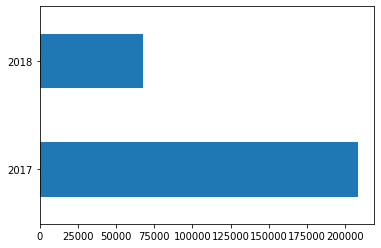

In [19]:
df.S_2.dt.year.value_counts().plot(kind = 'barh')

<AxesSubplot:>

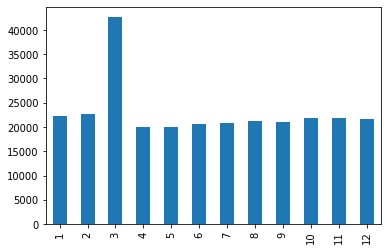

In [20]:
df.S_2.dt.month.value_counts().sort_index().plot(kind = 'bar')

<AxesSubplot:>

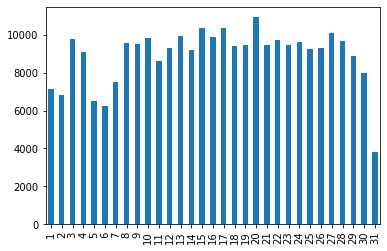

In [21]:
df.S_2.dt.day.value_counts().sort_index().plot(kind = 'bar')

In [22]:
#df.loc[:,categoricas]

In [23]:
df.isnull().sum().sort_values(ascending = False)

D_87           276359
D_88           276278
D_108          275135
D_110          274970
D_111          274970
B_39           274872
D_73           273850
B_42           272946
D_135          267034
D_137          267034
D_136          267034
D_138          267034
D_134          267034
R_9            260891
B_29           257592
D_106          249558
D_132          249487
D_49           249346
R_26           246027
D_66           245464
D_76           245449
D_42           237215
D_142          229717
D_53           204178
D_82           202585
D_50           157194
B_17           157016
D_105          151455
D_56           150015
S_9            146901
D_77           126108
D_43            83120
S_27            69964
D_46            60599
S_3             51172
S_7             51172
D_62            37892
D_48            35839
D_61            29807
P_3             15161
D_78            13715
D_44            13715
D_64            11049
D_68            10984
D_83             9883
D_69      

In [24]:
df.isnull().sum().sort_values(ascending = False)/df.shape[0] 

D_87           0.999230
D_88           0.998937
D_108          0.994804
D_110          0.994208
D_111          0.994208
B_39           0.993853
D_73           0.990158
B_42           0.986889
D_135          0.965514
D_137          0.965514
D_136          0.965514
D_138          0.965514
D_134          0.965514
R_9            0.943302
B_29           0.931374
D_106          0.902326
D_132          0.902069
D_49           0.901559
R_26           0.889559
D_66           0.887523
D_76           0.887469
D_42           0.857697
D_142          0.830587
D_53           0.738245
D_82           0.732486
D_50           0.568366
B_17           0.567722
D_105          0.547615
D_56           0.542408
S_9            0.531149
D_77           0.455968
D_43           0.300537
S_27           0.252968
D_46           0.219108
S_3            0.185022
S_7            0.185022
D_62           0.137006
D_48           0.129583
D_61           0.107773
P_3            0.054818
D_78           0.049589
D_44           0

In [25]:
#df.loc[:,list((100*(df.isnull().sum()/len(df.index)) >= 0.50))]

In [26]:
def rmissingvaluecol(dff, threshold):
    l = []
    l = list(dff.drop(dff.loc[:,list((100*(dff.isnull().sum()/len(dff.index)) >= threshold))].columns, 1).columns.values)
    print("# Columns having more than %s percent missing values: "%threshold, (dff.shape[1] - len(l)))
    print("Columns:\n", list(set(list((dff.columns.values))) - set(l)))
    return l


filterscolumnsname = rmissingvaluecol(df,70)

# Columns having more than 70 percent missing values:  25
Columns:
 ['D_132', 'D_76', 'D_42', 'D_49', 'D_88', 'B_29', 'B_42', 'D_110', 'B_39', 'D_137', 'D_73', 'D_142', 'D_53', 'D_106', 'D_134', 'D_87', 'R_26', 'D_138', 'R_9', 'D_136', 'D_111', 'D_82', 'D_135', 'D_66', 'D_108']


C:\Users\mlard\AppData\Local\Temp\ipykernel_6368\1987757029.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  l = list(dff.drop(dff.loc[:,list((100*(dff.isnull().sum()/len(dff.index)) >= threshold))].columns, 1).columns.values)


In [27]:
#funcion para eliminar rows en base a porcentaje de nans en cada row (no es relevante al parecer usar esta funcion)
def rmissingvaluerow(df, perc):
    min_count =  int(((100-perc)/100)*df.shape[1] + 1)
    mod_df = df.dropna( axis=0, thresh=min_count)
    return mod_df

In [28]:
dff = df[filterscolumnsname]

In [29]:
dff.shape

(276572, 167)

In [30]:
dff.isnull().sum().sort_values(ascending = False)/dff.shape[0] 

D_50           0.568366
B_17           0.567722
D_105          0.547615
D_56           0.542408
S_9            0.531149
D_77           0.455968
D_43           0.300537
S_27           0.252968
D_46           0.219108
S_7            0.185022
S_3            0.185022
D_62           0.137006
D_48           0.129583
D_61           0.107773
P_3            0.054818
D_44           0.049589
D_78           0.049589
D_64           0.039950
D_68           0.039715
D_69           0.035734
D_83           0.035734
D_55           0.033333
D_124          0.032281
D_118          0.032281
D_119          0.032281
D_116          0.032281
D_120          0.032281
D_121          0.032281
D_114          0.032281
D_113          0.032281
D_122          0.032281
D_123          0.032281
D_117          0.032281
D_115          0.032281
D_125          0.032281
D_91           0.028766
R_27           0.023535
D_126          0.021430
D_59           0.019521
D_107          0.018581
D_141          0.018581
D_143          0

In [31]:
d_feats = [c for c in dff.columns if c.startswith('D_')]
s_feats = [c for c in dff.columns if c.startswith('S_')]
p_feats = [c for c in dff.columns if c.startswith('P_')]
b_feats = [c for c in dff.columns if c.startswith('B_')]
r_feats = [c for c in dff.columns if c.startswith('R_')]
print(f'Number of Delinquency variables: {len(d_feats)}')
print(f'Number of Spend variables: {len(s_feats)}')
print(f'Number of Payment variables: {len(p_feats)}')
print(f'Number of Balance variables: {len(b_feats)}')
print(f'Number of Risk variables: {len(r_feats)}')
print(f'Total variable counts: {len(d_feats)+ len(s_feats)+ len(p_feats) + len(b_feats) + len(r_feats)}')

Number of Delinquency variables: 76
Number of Spend variables: 22
Number of Payment variables: 3
Number of Balance variables: 37
Number of Risk variables: 26
Total variable counts: 164


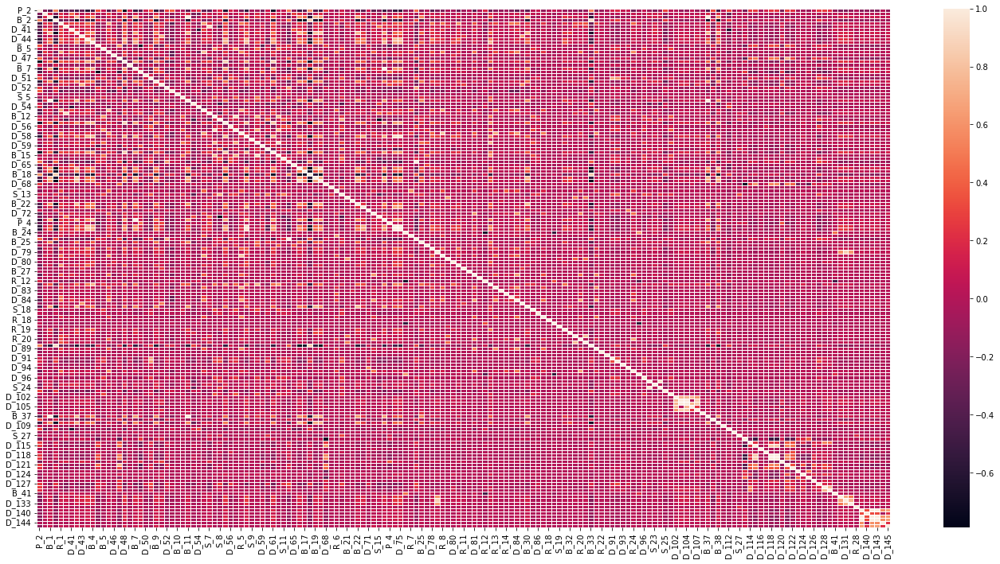

In [32]:
plt.figure(figsize = (24, 12))

corr = dff.drop(['target', 'Unnamed: 0'], axis=1).corr()
sns.heatmap(corr, annot = False, linewidths = 1)
plt.show()

In [33]:
correlated_features = set()

for i in range(len(corr.columns)):
    for j in range(i):
        if abs(corr.iloc[i, j]) > 0.7:
            colname = corr.columns[i]
            correlated_features.add(colname)


In [34]:
correlated_features

{'B_11',
 'B_13',
 'B_14',
 'B_15',
 'B_16',
 'B_18',
 'B_19',
 'B_20',
 'B_22',
 'B_23',
 'B_28',
 'B_3',
 'B_30',
 'B_33',
 'B_37',
 'B_38',
 'B_8',
 'D_103',
 'D_104',
 'D_105',
 'D_107',
 'D_113',
 'D_118',
 'D_119',
 'D_121',
 'D_129',
 'D_131',
 'D_133',
 'D_141',
 'D_143',
 'D_48',
 'D_55',
 'D_58',
 'D_61',
 'D_74',
 'D_75',
 'D_77',
 'R_21',
 'R_4',
 'R_8',
 'S_15',
 'S_24',
 'S_7'}

In [35]:
type(correlated_features)

set

In [36]:
correlated_features.update(['target', 'Unnamed: 0'])
correlated_features

{'B_11',
 'B_13',
 'B_14',
 'B_15',
 'B_16',
 'B_18',
 'B_19',
 'B_20',
 'B_22',
 'B_23',
 'B_28',
 'B_3',
 'B_30',
 'B_33',
 'B_37',
 'B_38',
 'B_8',
 'D_103',
 'D_104',
 'D_105',
 'D_107',
 'D_113',
 'D_118',
 'D_119',
 'D_121',
 'D_129',
 'D_131',
 'D_133',
 'D_141',
 'D_143',
 'D_48',
 'D_55',
 'D_58',
 'D_61',
 'D_74',
 'D_75',
 'D_77',
 'R_21',
 'R_4',
 'R_8',
 'S_15',
 'S_24',
 'S_7',
 'Unnamed: 0',
 'target'}

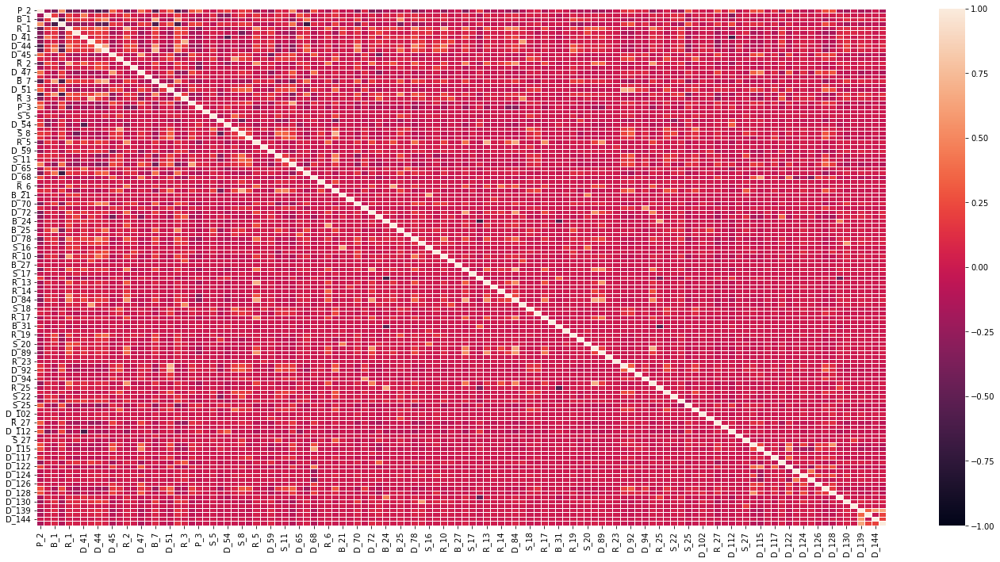

In [37]:
plt.figure(figsize = (24, 12))

corr = dff.drop(correlated_features, axis = 1).corr()
sns.heatmap(corr, annot = False, linewidths = 1, vmax=1, vmin= -1)
plt.show()

In [38]:
corr

,P_2,D_39,B_1,B_2,R_1,S_3,D_41,D_43,D_44,B_4,...,D_126,D_127,D_128,B_41,D_130,R_28,D_139,D_140,D_144,D_145
P_2,1.000000,-0.188916,-0.366659,0.545147,-0.465730,-0.332421,-0.317509,-0.298504,-0.577744,-0.450637,...,0.075419,0.259206,0.269117,-0.126154,-0.214165,-0.018251,-0.183753,-0.134921,0.005269,-0.163097
D_39,-0.188916,1.000000,0.181912,-0.194391,0.196931,0.052907,0.439796,0.040196,0.133726,0.169273,...,0.014962,0.018484,0.015735,0.062723,0.045159,-0.000798,0.030864,0.021493,0.010737,0.022893
B_1,-0.366659,0.181912,1.000000,-0.631564,0.231405,0.151530,0.187335,0.072664,0.326039,0.496425,...,-0.007506,-0.144958,-0.041024,0.036378,0.138989,0.054500,0.104117,0.054074,0.037895,0.078824
B_2,0.545147,-0.194391,-0.631564,1.000000,-0.304911,-0.232457,-0.258866,-0.142188,-0.451696,-0.513620,...,0.008634,0.243570,0.100880,-0.054559,-0.199623,-0.029732,-0.155493,-0.093418,-0.040553,-0.124552
R_1,-0.465730,0.196931,0.231405,-0.304911,1.000000,0.208711,0.277813,0.183031,0.400396,0.295011,...,-0.000975,-0.095748,-0.063066,0.097361,0.123388,0.046278,0.082728,0.064517,0.004274,0.074168
S_3,-0.332421,0.052907,0.151530,-0.232457,0.208711,1.000000,0.081174,0.158812,0.190281,0.144382,...,-0.063828,-0.184914,-0.165287,0.063841,0.113449,0.083242,0.048563,0.054439,-0.019429,0.046060
D_41,-0.317509,0.439796,0.187335,-0.258866,0.277813,0.081174,1.000000,0.055348,0.167628,0.156945,...,0.006180,-0.041318,-0.008027,0.142472,0.057958,-0.004338,0.052529,0.035221,0.013002,0.045798
D_43,-0.298504,0.040196,0.072664,-0.142188,0.183031,0.158812,0.055348,1.000000,0.240377,0.120718,...,-0.023055,-0.085783,-0.116086,0.058727,0.145323,0.016108,0.070488,0.060261,-0.007539,0.068106
D_44,-0.577744,0.133726,0.326039,-0.451696,0.400396,0.190281,0.167628,0.240377,1.000000,0.628142,...,0.018547,-0.165282,-0.082215,0.050640,0.211047,0.002398,0.124550,0.091370,0.020780,0.105362
B_4,-0.450637,0.169273,0.496425,-0.513620,0.295011,0.144382,0.156945,0.120718,0.628142,1.000000,...,0.032909,-0.199010,-0.021426,0.041805,0.177330,0.006660,0.090705,0.048263,0.038840,0.061685


In [39]:
corr.columns

Index(['P_2', 'D_39', 'B_1', 'B_2', 'R_1', 'S_3', 'D_41', 'D_43', 'D_44',
       'B_4',
       ...
       'D_126', 'D_127', 'D_128', 'B_41', 'D_130', 'R_28', 'D_139', 'D_140',
       'D_144', 'D_145'],
      dtype='object', length=118)

In [40]:
corr.index

Index(['P_2', 'D_39', 'B_1', 'B_2', 'R_1', 'S_3', 'D_41', 'D_43', 'D_44',
       'B_4',
       ...
       'D_126', 'D_127', 'D_128', 'B_41', 'D_130', 'R_28', 'D_139', 'D_140',
       'D_144', 'D_145'],
      dtype='object', length=118)

In [41]:
list(corr.columns) + cole

['P_2',
 'D_39',
 'B_1',
 'B_2',
 'R_1',
 'S_3',
 'D_41',
 'D_43',
 'D_44',
 'B_4',
 'D_45',
 'B_5',
 'R_2',
 'D_46',
 'D_47',
 'B_6',
 'B_7',
 'D_50',
 'D_51',
 'B_9',
 'R_3',
 'D_52',
 'P_3',
 'B_10',
 'S_5',
 'S_6',
 'D_54',
 'B_12',
 'S_8',
 'D_56',
 'R_5',
 'S_9',
 'D_59',
 'D_60',
 'S_11',
 'D_62',
 'D_65',
 'B_17',
 'D_68',
 'S_12',
 'R_6',
 'S_13',
 'B_21',
 'D_69',
 'D_70',
 'D_71',
 'D_72',
 'P_4',
 'B_24',
 'R_7',
 'B_25',
 'B_26',
 'D_78',
 'D_79',
 'S_16',
 'D_80',
 'R_10',
 'R_11',
 'B_27',
 'D_81',
 'S_17',
 'R_12',
 'R_13',
 'D_83',
 'R_14',
 'R_15',
 'D_84',
 'R_16',
 'S_18',
 'D_86',
 'R_17',
 'R_18',
 'B_31',
 'S_19',
 'R_19',
 'B_32',
 'S_20',
 'R_20',
 'D_89',
 'R_22',
 'R_23',
 'D_91',
 'D_92',
 'D_93',
 'D_94',
 'R_24',
 'R_25',
 'D_96',
 'S_22',
 'S_23',
 'S_25',
 'S_26',
 'D_102',
 'B_36',
 'R_27',
 'D_109',
 'D_112',
 'B_40',
 'S_27',
 'D_114',
 'D_115',
 'D_116',
 'D_117',
 'D_120',
 'D_122',
 'D_123',
 'D_124',
 'D_125',
 'D_126',
 'D_127',
 'D_128',
 'B_41'

In [42]:
dfff = dff.loc[:,list(corr.columns) + cole + ["target"] ]

In [51]:
dfff.columns

Index(['P_2', 'D_39', 'B_1', 'B_2', 'R_1', 'S_3', 'D_41', 'D_43', 'D_44',
       'B_4',
       ...
       'R_28', 'D_139', 'D_140', 'D_144', 'D_145', 'customer_ID', 'S_2',
       'D_63', 'D_64', 'target'],
      dtype='object', length=123)

In [43]:
dfff.shape

(276572, 123)

In [44]:
dfff.info(verbose=True, null_counts=True)

C:\Users\mlard\AppData\Local\Temp\ipykernel_6368\1057736666.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  dfff.info(verbose=True, null_counts=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 276572 entries, 0 to 276571
Data columns (total 123 columns):
 #    Column       Non-Null Count   Dtype         
---   ------       --------------   -----         
 0    P_2          274277 non-null  float64       
 1    D_39         276572 non-null  float64       
 2    B_1          276572 non-null  float64       
 3    B_2          276476 non-null  float64       
 4    R_1          276572 non-null  float64       
 5    S_3          225400 non-null  float64       
 6    D_41         276476 non-null  float64       
 7    D_43         193452 non-null  float64       
 8    D_44         262857 non-null  float64       
 9    B_4          276572 non-null  float64       
 10   D_45         276476 non-null  float64       
 11   B_5          276572 non-null  float64       
 12   R_2          276572 non-null  float64       
 13   D_46         215973 non-null  float64       
 14   D_47         276572 non-null  float64       
 15   B_6          27

In [45]:
dfff.describe()

,P_2,D_39,B_1,B_2,R_1,S_3,D_41,D_43,D_44,B_4,...,D_127,D_128,B_41,D_130,R_28,D_139,D_140,D_144,D_145,target
count,274277.000000,2.765720e+05,276572.000000,2.764760e+05,2.765720e+05,225400.000000,2.764760e+05,193452.000000,2.628570e+05,2.765720e+05,...,2.765720e+05,2.714330e+05,2.765340e+05,2.714330e+05,2.765720e+05,2.714330e+05,2.745300e+05,2.745230e+05,2.714330e+05,276572.000000
mean,0.656094,1.534640e-01,0.124308,6.218612e-01,7.864847e-02,0.225812,5.941618e-02,0.153990,1.185817e-01,1.730830e-01,...,1.072242e-01,5.831390e-01,3.222594e-02,2.016633e-01,5.860529e-03,1.776248e-01,2.673155e-02,5.165175e-02,6.113005e-02,0.248923
std,0.244733,2.706362e-01,0.212576,4.013308e-01,2.255157e-01,0.192625,2.006907e-01,0.211072,2.204076e-01,2.227333e-01,...,3.029530e-01,4.933003e-01,2.191798e-01,3.974979e-01,2.953451e-02,3.779312e-01,1.458412e-01,1.806857e-01,1.905855e-01,0.432390
min,-0.440337,5.081586e-08,-0.529935,5.455276e-07,2.153178e-07,-0.443089,2.581347e-07,0.000003,2.222165e-09,2.042271e-07,...,6.665625e-09,9.328776e-09,2.735268e-08,8.005983e-08,4.699454e-09,2.547751e-08,2.158847e-08,1.969412e-08,1.295045e-08,0.000000
25%,0.479994,4.525406e-03,0.008890,1.062215e-01,2.899602e-03,0.127284,2.870306e-03,0.042251,3.829458e-03,2.766178e-02,...,2.780404e-03,5.956792e-03,2.547009e-03,3.124682e-03,2.494037e-03,3.035184e-03,2.562787e-03,2.748156e-03,3.029659e-03,0.000000
50%,0.694160,9.069601e-03,0.031279,8.143633e-01,5.781294e-03,0.163867,5.749618e-03,0.088102,7.670775e-03,8.243567e-02,...,5.574577e-03,1.000421e+00,5.101276e-03,6.216258e-03,5.005939e-03,6.034572e-03,5.112665e-03,5.501956e-03,6.047234e-03,0.000000
75%,0.864573,2.371768e-01,0.126282,1.002397e+00,8.655511e-03,0.258549,8.611234e-03,0.183644,1.320540e-01,2.391026e-01,...,8.362830e-03,1.004705e+00,7.657362e-03,9.323672e-03,7.504035e-03,9.075780e-03,7.657841e-03,8.259950e-03,9.063816e-03,0.000000
max,1.009999,5.362538e+00,1.324049,1.010000e+00,3.256284e+00,5.482888,6.315744e+00,7.548966,3.506895e+00,4.800353e+00,...,1.010000e+00,1.017865e+00,1.500785e+01,1.026128e+00,1.009961e+00,1.010000e+00,1.009999e+00,1.343272e+00,4.819670e+00,1.000000


In [46]:
"""from scipy import stats

def drop_numerical_outliers(df, z_thresh=3):
    # Constrains will contain `True` or `False` depending on if it is a value below the threshold.
    constrains = df.select_dtypes(include=[np.number]) \
        .apply(lambda x: np.abs(stats.zscore(x)) < z_thresh) \
        .all(axis=1)
    # Drop (inplace) values set to be rejected
    df.drop(df.index[~constrains], inplace=True)"""

'from scipy import stats\n\ndef drop_numerical_outliers(df, z_thresh=3):\n    # Constrains will contain `True` or `False` depending on if it is a value below the threshold.\n    constrains = df.select_dtypes(include=[np.number])         .apply(lambda x: np.abs(stats.zscore(x)) < z_thresh)         .all(axis=1)\n    # Drop (inplace) values set to be rejected\n    df.drop(df.index[~constrains], inplace=True)'

In [47]:
#drop_numerical_outliers(dfff)


In [48]:
#dfff QUEDA ELIMINAR OUTLIERS, convertir nans en algun valor como media o algo así y chau preparacion de datos. Arranco con features

Relleno los valores faltantes con la media

In [52]:
from sklearn.impute import SimpleImputer
columnas = dfff.columns
imp = SimpleImputer(missing_values = np.nan, strategy = 'mean')
imp.fit(dfff)
df_sin_null = pd.DataFrame(imp.transform(dfff), columns=columnas)

ValueError: Cannot use mean strategy with non-numeric data:
could not convert string to float: '743d55408505dee752adc6e62b273f4397db6e89f190349bacc8cf7227a6cf54'

In [ ]:
df_sin_null.isnull().sum().sort_values(ascending = False)/df.shape[0]

In [49]:
dfff.shape

(276572, 123)

In [50]:
# dfff.to_csv("../data/dfff.csv" ,index=False)
dfff.to_csv("C:/Users/mlard/OneDrive/Escritorio/Mateo/Org de Datos/tp3Github/Org-Datos-Grupo-19/dfff.csv", index = False)